<a href="https://colab.research.google.com/github/djbradyAtOpticalSciencesArizona/computationalImaging/blob/master/sampling/slantedEdgeMTFAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Slanted Edge MTF Measurement

## David Brady
## University of Arizona
## Spring 2023

This notebook uses slanted edge images to analyze the MTF for a Samsung note20 Ultra smart phone. The listed camera specifications are as follows

108 MP, f/1.8, 26mm (wide), 1/1.33", 0.8µm, PDAF, Laser AF, OIS

12 MP, f/3.0, 120mm (periscope telephoto), 1.0µm, PDAF, OIS, 5x optical zoom, 50x hybrid zoom

12 MP, f/2.2, 120˚, 13mm (ultrawide), 1/2.55", 1.4µm

These specifications are in marketing speak, the focal lengths listed are 35 mm equivalent. The actual focal lengths are 2.2 mm for the ultrawide, 7 mm for the wide and 14.2 mm for the telephoto. 

In [339]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.optimize import curve_fit
from scipy.special import erf
from google.colab import files
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]
plt.rcParams.update({'font.size': 22})


In [340]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [341]:
!pip install rawpy
import rawpy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## telephoto lens

We consider below  a photo taken with the telephoto lens. 

samsung SM-N986U1
ƒ/3
1/30
14.2mm
ISO32

In [342]:
raw = rawpy.imread('drive/MyDrive/courses/computationalPhotography/14p2mm.dng')
rawImage=raw.raw_image_visible

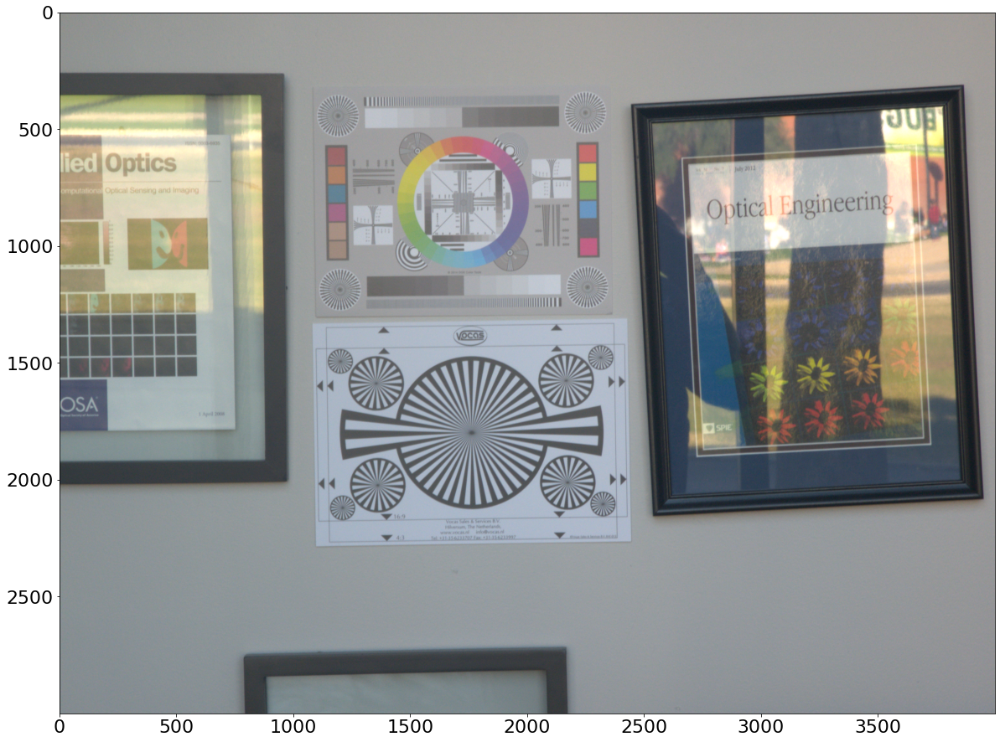

In [ ]:
plt.imshow(raw.postprocess())

In [ ]:
rawImage.shape

(3000, 4000)

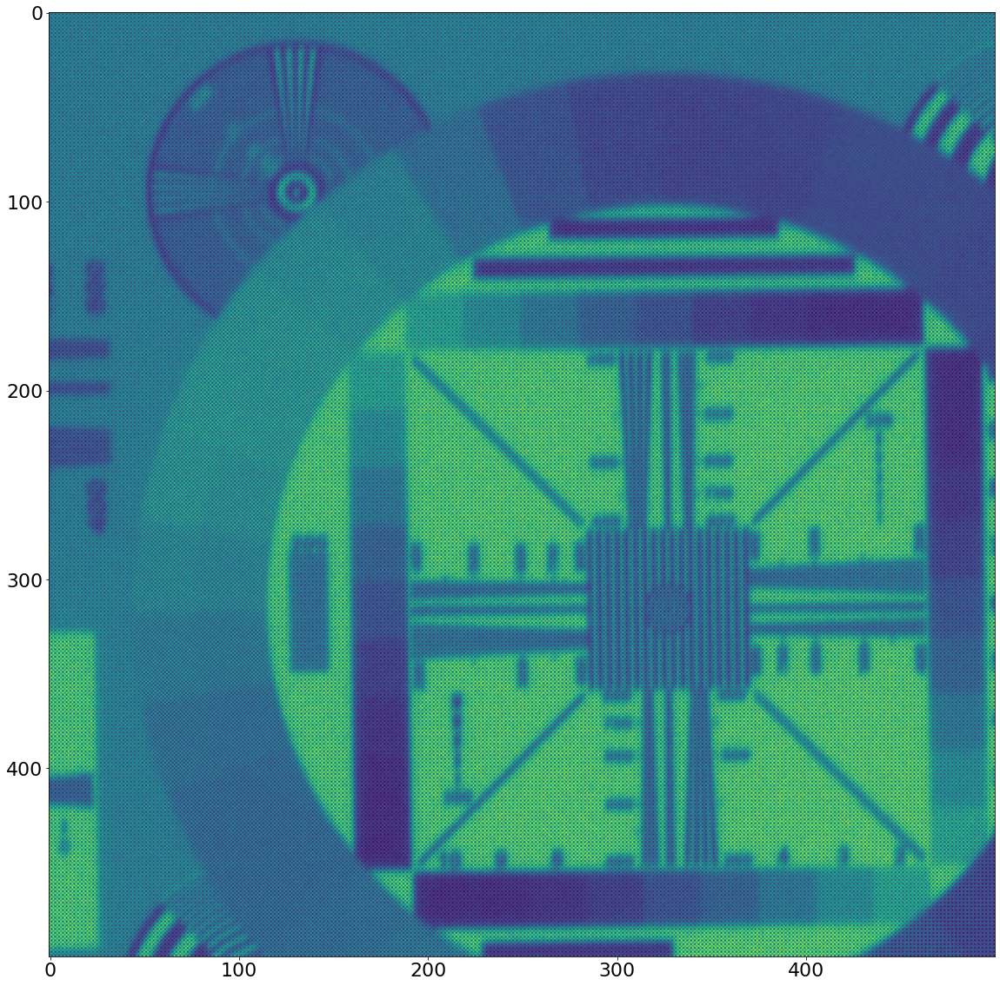

In [ ]:
plt.imshow(rawImage[500:1000,1400:1900])

we break the image into its RGB components with the following code. The green images should look the same, look for red and blue features in the original image to identify the corresponding channels. 

In [343]:
b=rawImage[0:3000:2,0:4000:2]
r=rawImage[1:3000:2,1:4000:2]
g1=rawImage[1:3000:2,0:4000:2]
g2=rawImage[0:3000:2,1:4000:2]

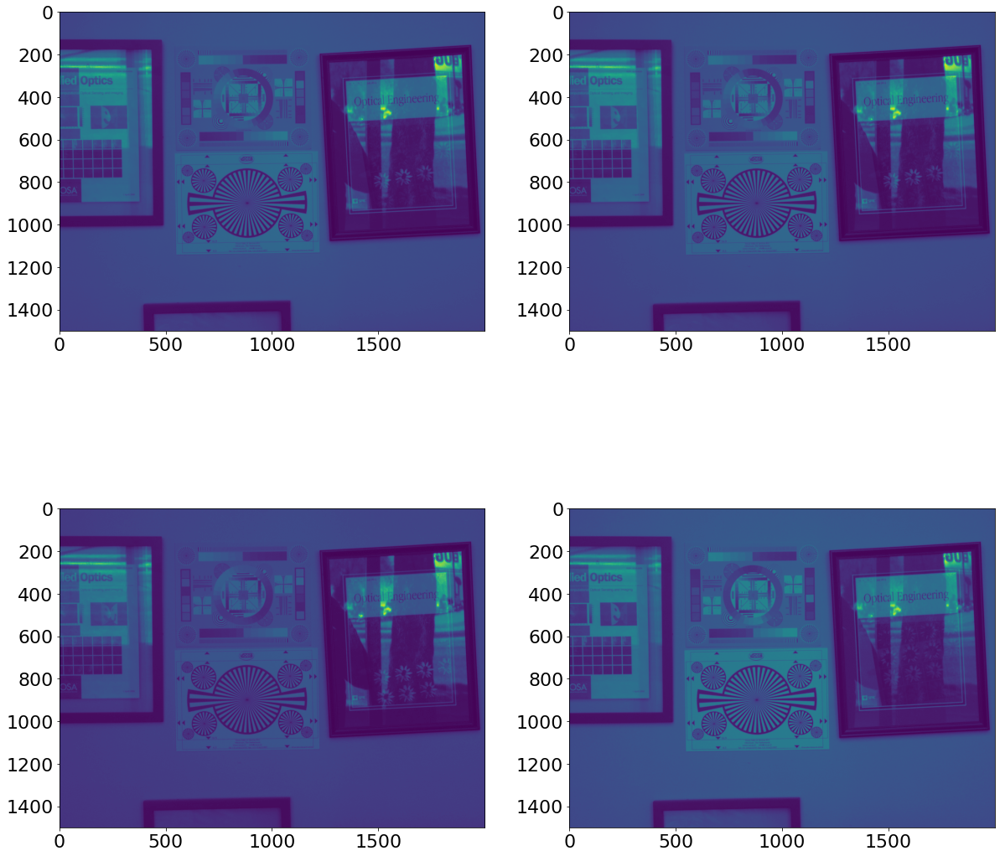

In [326]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(g1)
plt.subplot(2,2,2)
plt.imshow(g2)
plt.subplot(2,2,3)
plt.imshow(r)
plt.subplot(2,2,4)
plt.imshow(b)

In [99]:
g1.dtype

dtype('uint16')

In [108]:
print(np.max(b), np.min(b))

588 6


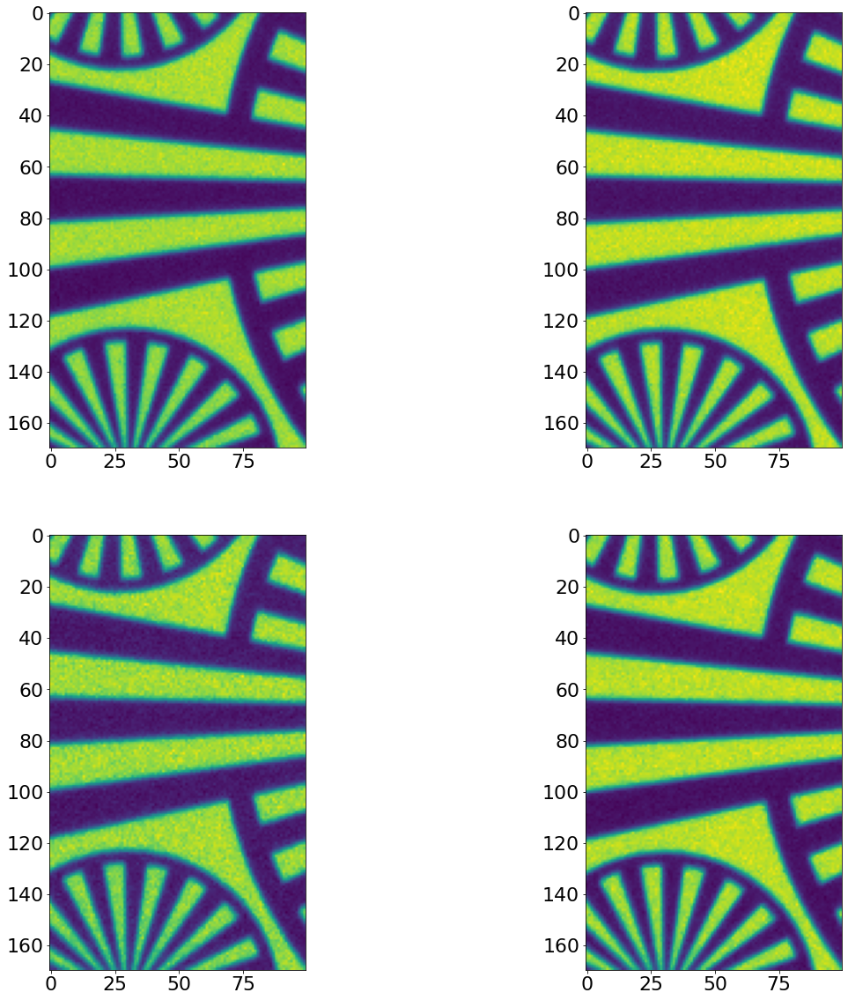

In [6]:
plt.subplot(2,2,1)
plt.imshow(g1[830:1000,650:750])
plt.subplot(2,2,2)
plt.imshow(g2[830:1000,650:750])
plt.subplot(2,2,3)
plt.imshow(r[830:1000,650:750])
plt.subplot(2,2,4)
plt.imshow(b[830:1000,650:750])

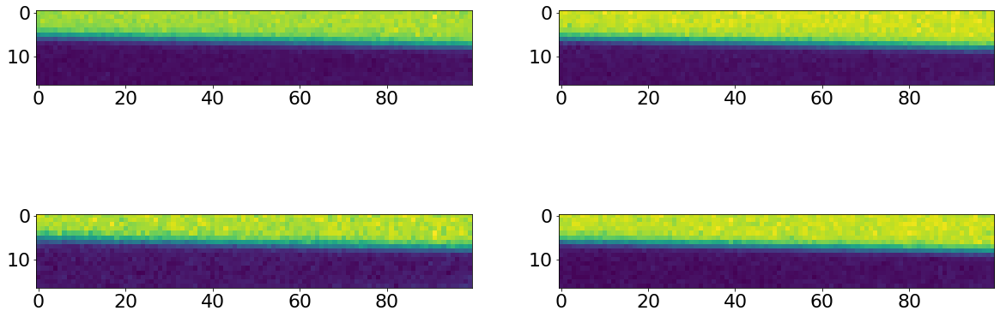

In [344]:
plt.rcParams['figure.figsize'] = [20, 8]
g1c=g1[888:905,650:750]
g2c=g2[888:905,650:750]
rc=r[888:905,650:750]
bc=b[888:905,650:750]
plt.subplot(2,2,1)
plt.imshow(g1c)
plt.subplot(2,2,2)
plt.imshow(g2c)
plt.subplot(2,2,3)
plt.imshow(rc)
plt.subplot(2,2,4)
plt.imshow(bc)

To find the relative displacement of the edge between rows we need to find the slope of the edge, which we do here.

mean slope = 0.025259525952595265


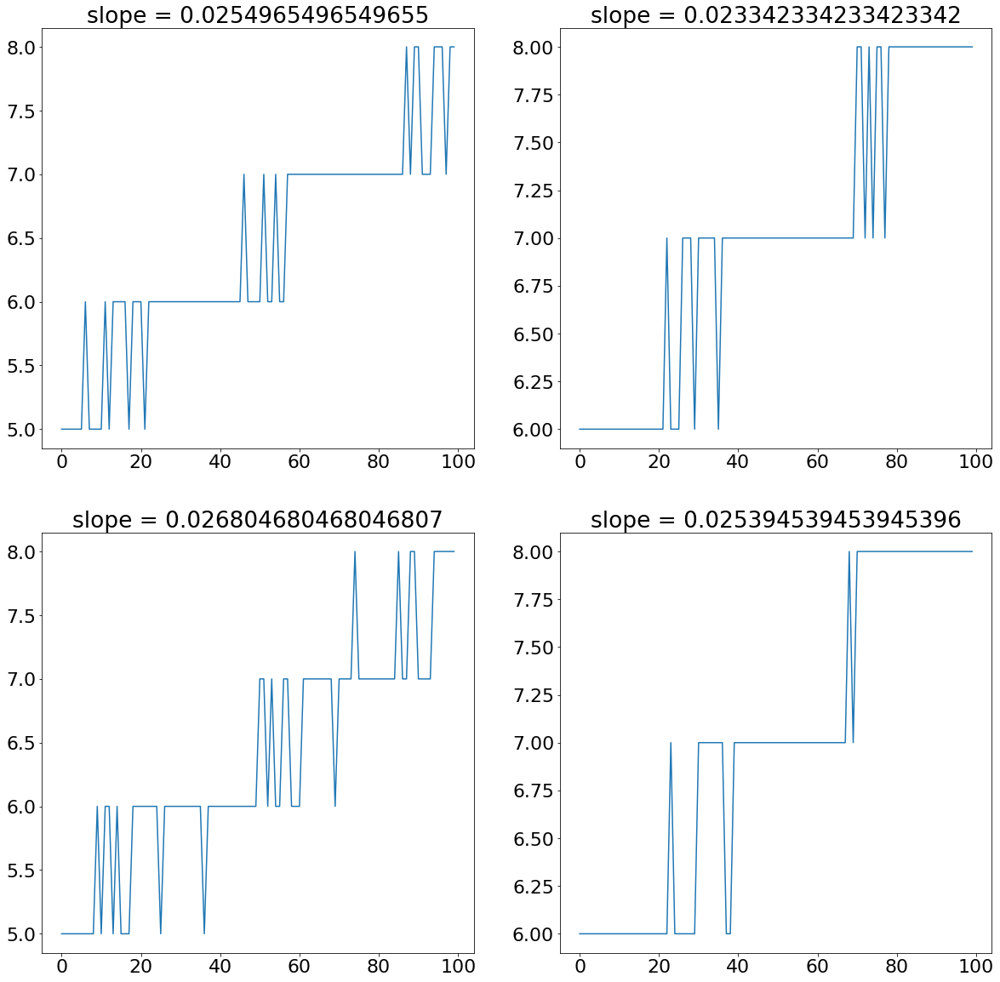

In [345]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
y=np.argmin(np.gradient(g1[888:905,650:750], axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope
plt.subplot(2,2,2)
y=np.argmin(np.gradient(g2[888:905,650:750], axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
plt.subplot(2,2,3)
y=np.argmin(np.gradient(r[888:905,650:750], axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
plt.subplot(2,2,4)
y=np.argmin(np.gradient(b[888:905,650:750], axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope+slope
slope=slope/4
print('mean slope =', slope)

If we plot data along a single column we only have a couple of data points within the edge region. 

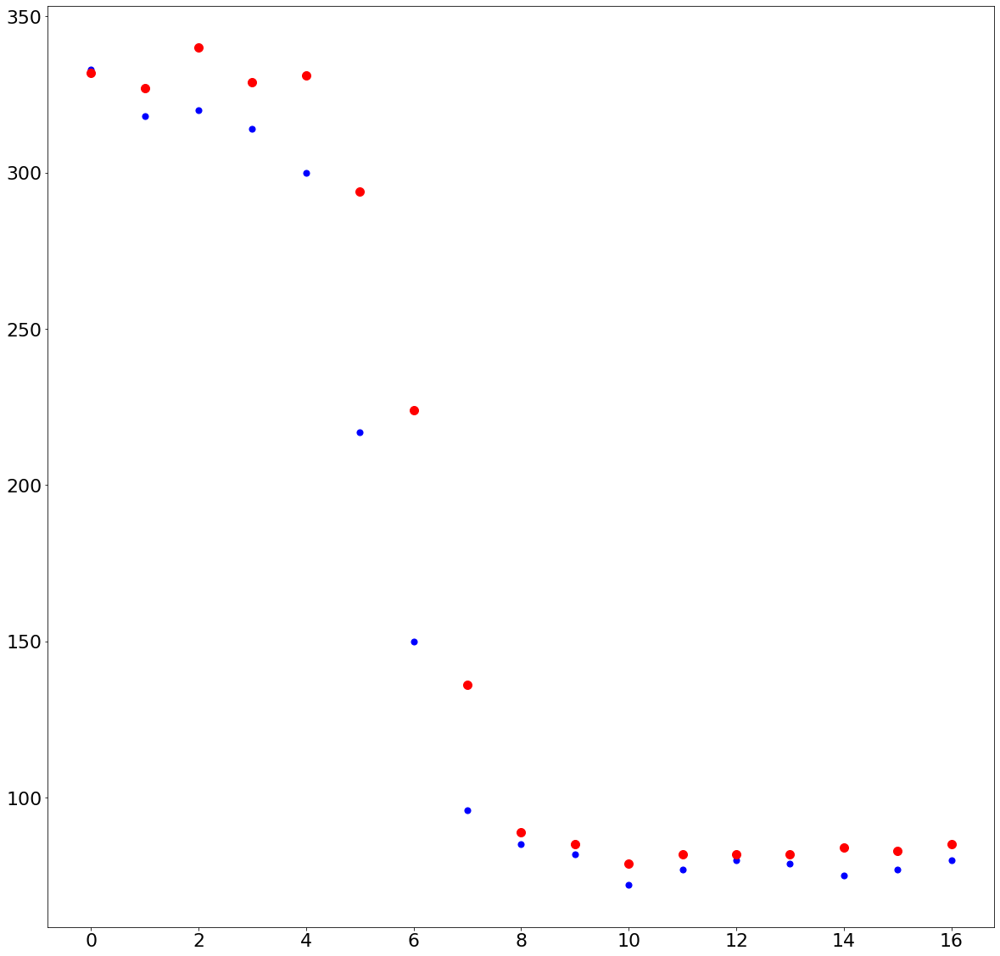

In [99]:
plt.scatter(np.arange(17),g1c[:,0], s=50, c='blue')
plt.scatter( np.arange(17),g1c[:,39], s=100,c='red')

shifting the edge points according to the slope of the edge and combining data from multiple columns, we can densely sample the edge region. The function describing the edge is the edge shape function.

In [346]:
points=np.zeros((np.size(g2c),2))
for pop in np.arange(g2c.shape[0]):
  for pip in np.arange(g2c.shape[1]):
    points[pop*g2c.shape[1]+pip,:]=(pop-slope*pip,g2c[pop,pip])
points=points[points[:,0].argsort(),:]


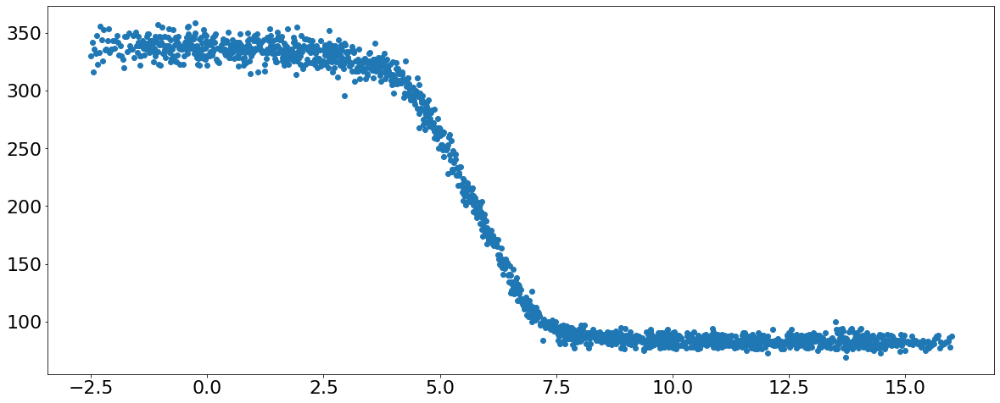

In [347]:
plt.scatter(points[:,0],points[:,1])

We choose to model the edge as an erf function and find the best fit parameters to the erf. 

In [348]:
def erfunc(x, A, c, sig, off):
    return A*erf((x-c)/sig)+off

A , c, sig, off = -100., 6., 2., 150.


params, extras = curve_fit(erfunc, points[:,0],points[:,1],
                                    p0=[A, c, sig, off])

Text(0.5, 0, 'pixels')

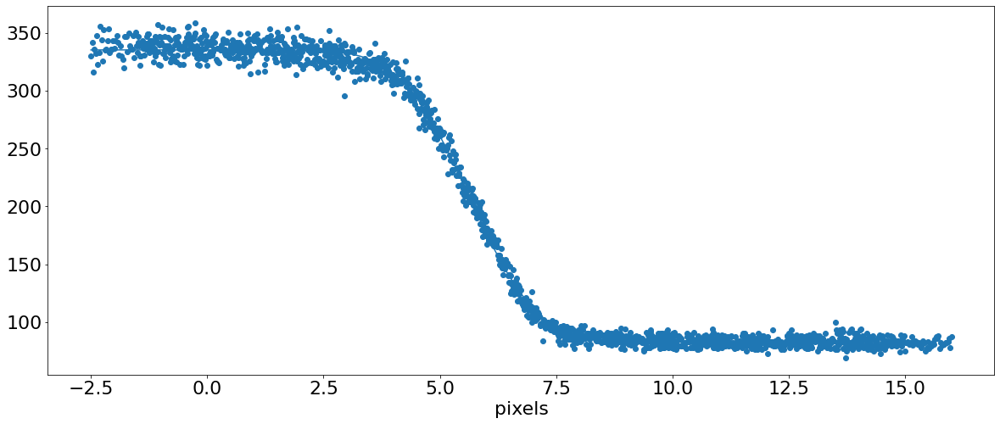

In [349]:
xx=np.linspace(-2.5,15,128)
plt.plot(xx, erfunc(xx, *params))
plt.scatter(points[:,0],points[:,1])
plt.xlabel('pixels')

The ERF function has the form
$$
{\rm erf}(x)=\frac{2}{\sqrt{\pi}}\int_0^x e^{-y^2}dy
$$
such that 
$$
\frac{d}{dx}{\rm erf}(x)=\frac{2}{\sqrt{\pi}}e^{-x^2}
$$

In our parameter fit of the edge, we are not concerned with the position or height, we are only concerned with the width, $\sigma$, which defines the width of the transition. Here our **line shape function**, e.g. the derivative of the edge shape function, accounting for the fact that the pixel spacing for each color channel is 2 microns, looks like this

Text(0.5, 0, 'microns')

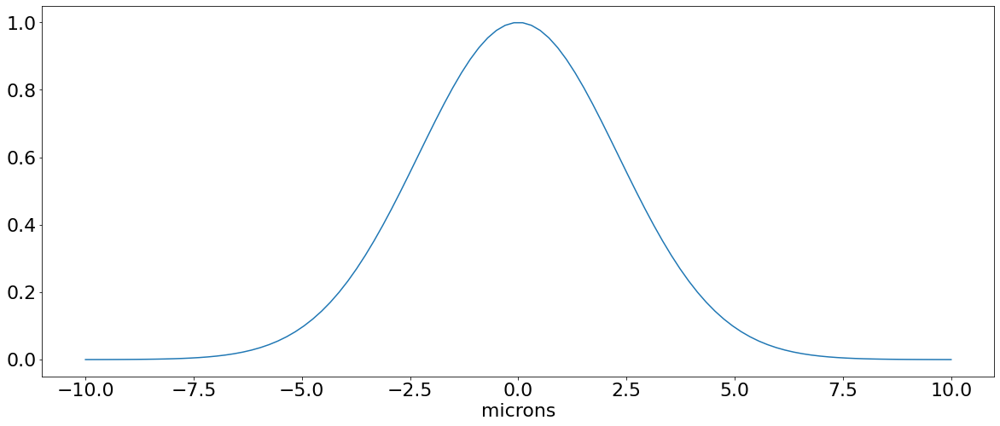

In [178]:
x=np.linspace(-10,10,100)
plt.plot(x, np.exp(-(x/(2*params[2]))**2))
plt.xlabel('microns')

In [126]:
params

array([-126.27321777,    5.62402979,    1.63133376,  209.13130858])

In [335]:
var=params[2]

In [336]:
var

1.6313337596191526

Text(0, 0.5, 'mtf')

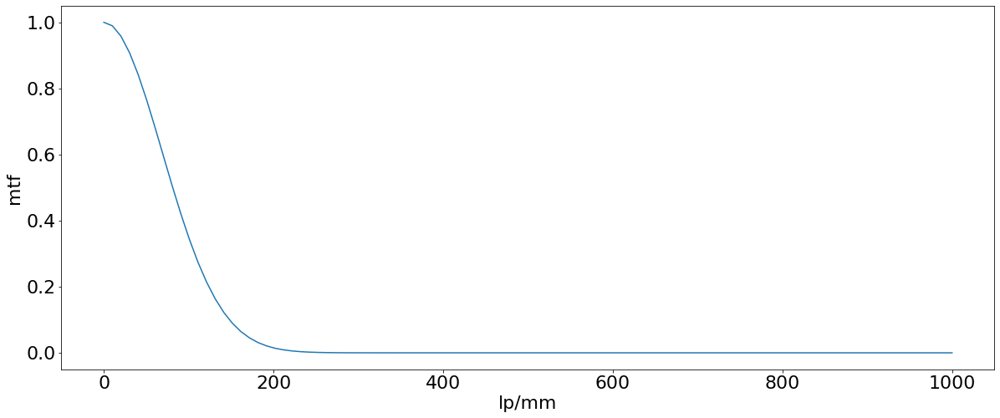

In [351]:
plt.plot(1000*np.linspace(0,1,100), np.exp(-(np.pi**2)*(4.*var**2)*np.linspace(0,1,100)**2))
plt.xlabel("lp/mm")
plt.ylabel('mtf')

In [352]:
sfrData=np.array([[0,1],[50.25,0.847],[100.5, .524],[150.751,.238],[201,.123],[251,.154],[301,.174],[351,.113],[402,.083]])

Text(0, 0.5, 'mtf')

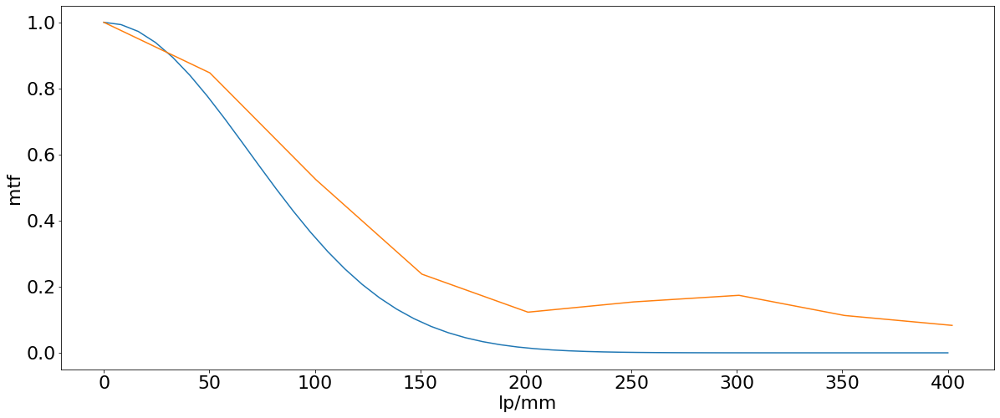

In [357]:
plt.plot(1000*np.linspace(0,.4,50), np.exp(-((np.pi))**2*(4*var**2)*np.linspace(0,.4,50)**2))
plt.plot(sfrData[:,0],sfrData[:,1])
plt.xlabel("lp/mm")
plt.ylabel('mtf')


## Ultrawide field lens

We consider below  a photo taken with the ultrawide lens. 

samsung SM-N986U1
ƒ/2.2
1/60
2.2mm
ISO80

In [242]:
raw = rawpy.imread('drive/MyDrive/courses/computationalPhotography/2p2mm.dng')
rawImage=raw.raw_image_visible

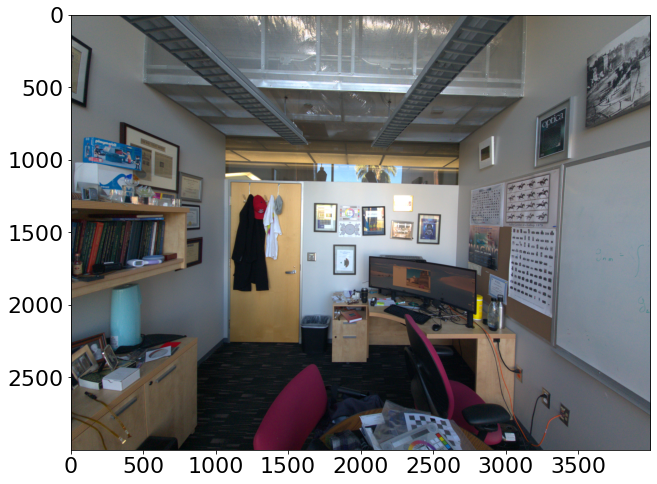

In [192]:
plt.imshow(raw.postprocess())

In [193]:
rawImage.shape

(3000, 4000)

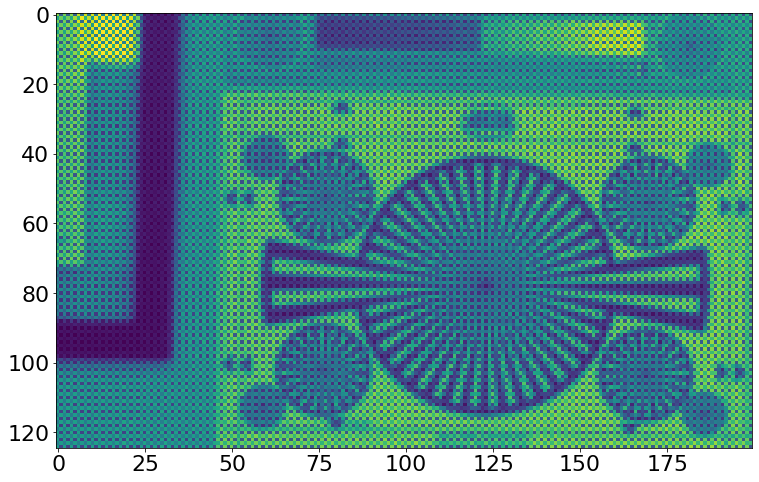

In [200]:
plt.imshow(rawImage[1400:1525,1800:2000])

we break the image into its RGB components with the following code.

In [243]:
g1=rawImage[0:3000:2,0:4000:2]
g2=rawImage[1:3000:2,1:4000:2]
b=rawImage[1:3000:2,0:4000:2]
r=rawImage[0:3000:2,1:4000:2]

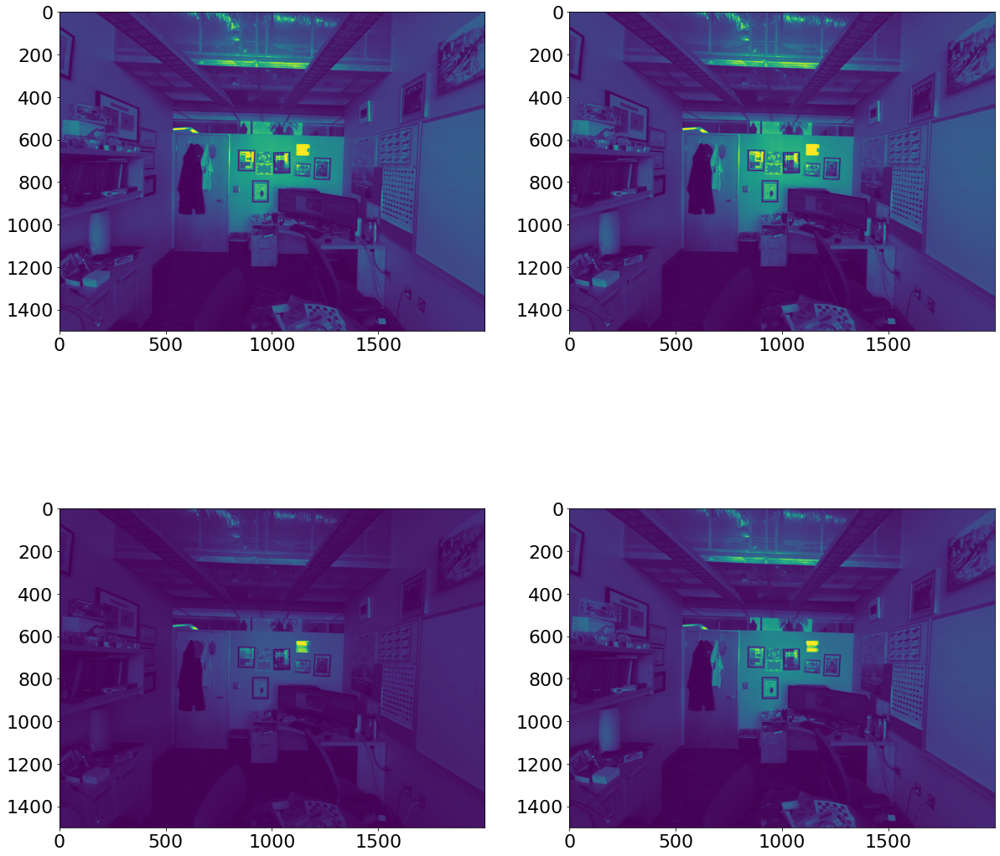

In [244]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(g1)
plt.subplot(2,2,2)
plt.imshow(g2)
plt.subplot(2,2,3)
plt.imshow(r)
plt.subplot(2,2,4)
plt.imshow(b)

In [204]:
g1.dtype

dtype('uint16')

In [205]:
print(np.max(b), np.min(b))

1023 0


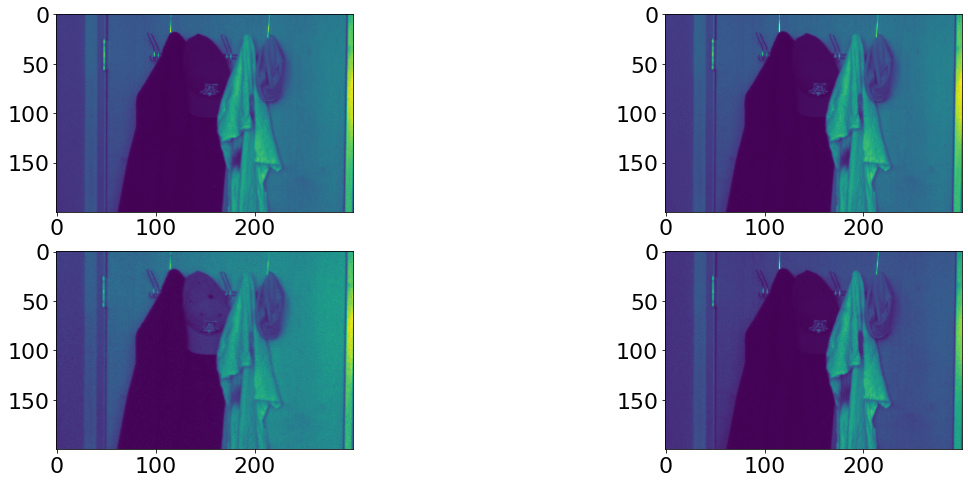

In [245]:
plt.subplot(2,2,1)
plt.imshow(g1[600:800,500:800])
plt.subplot(2,2,2)
plt.imshow(g2[600:800,500:800])
plt.subplot(2,2,3)
plt.imshow(r[600:800,500:800])
plt.subplot(2,2,4)
plt.imshow(b[600:800,500:800])

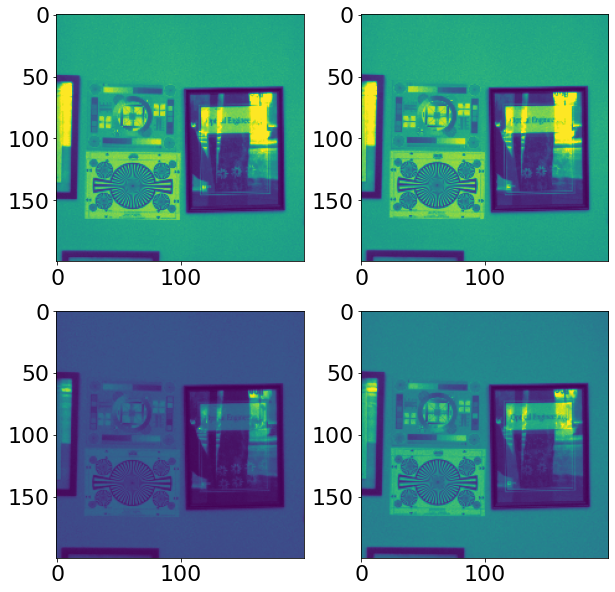

In [246]:
plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
plt.imshow(g1[600:800,900:1100])
plt.subplot(2,2,2)
plt.imshow(g2[600:800,900:1100])
plt.subplot(2,2,3)
plt.imshow(r[600:800,900:1100])
plt.subplot(2,2,4)
plt.imshow(b[600:800,900:1100])

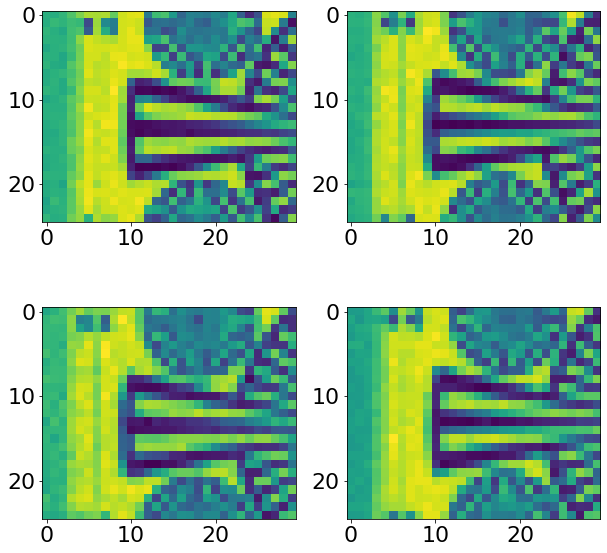

In [247]:
plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
plt.imshow(g1[725:750,920:950])
plt.subplot(2,2,2)
plt.imshow(g2[725:750,920:950])
plt.subplot(2,2,3)
plt.imshow(r[725:750,920:950])
plt.subplot(2,2,4)
plt.imshow(b[725:750,920:950])

note that the edge is about as sharp with the ultrawide camera as it is with the telephoto. The scale is, is of course, much less, so the angular resolution is worse by the ratio of the focal lengths. But the image blur is approximately $\lambda f/\#$, which independent of focal length.

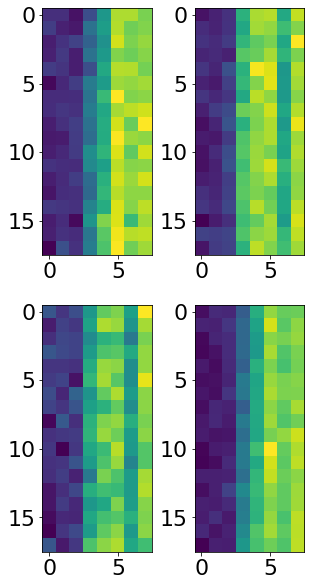

In [248]:
plt.figure(figsize=(5,10))
plt.subplot(2,2,1)
plt.imshow(g1[730:748,920:928])
plt.subplot(2,2,2)
plt.imshow(g2[730:748,920:928])
plt.subplot(2,2,3)
plt.imshow(r[730:748,920:928])
plt.subplot(2,2,4)
plt.imshow(b[730:748,920:928])

## Wide field lens

We consider below  a photo taken with the wide field lens. 

samsung SM-N986U1
ƒ/1.8
1/60
7mm
ISO50

In [249]:
raw = rawpy.imread('drive/MyDrive/courses/computationalPhotography/7mm.dng')
rawImage=raw.raw_image_visible

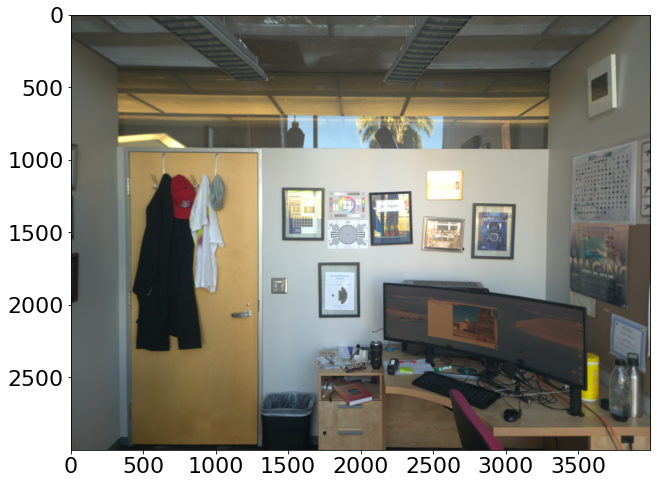

In [227]:
plt.imshow(raw.postprocess())

In [228]:
rawImage.shape

(3000, 4000)

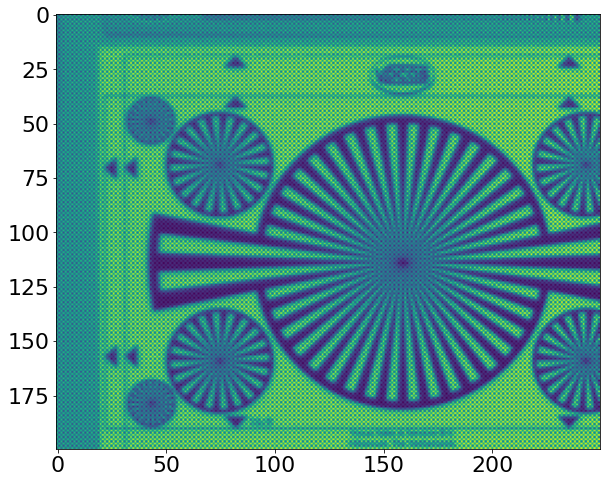

In [232]:
plt.imshow(rawImage[1400:1600,1750:2000])

we break the image into its RGB components with the following code.

In [252]:
g1=rawImage[0:3000:2,0:4000:2]
g2=rawImage[1:3000:2,1:4000:2]
b=rawImage[1:3000:2,0:4000:2]
r=rawImage[0:3000:2,1:4000:2]

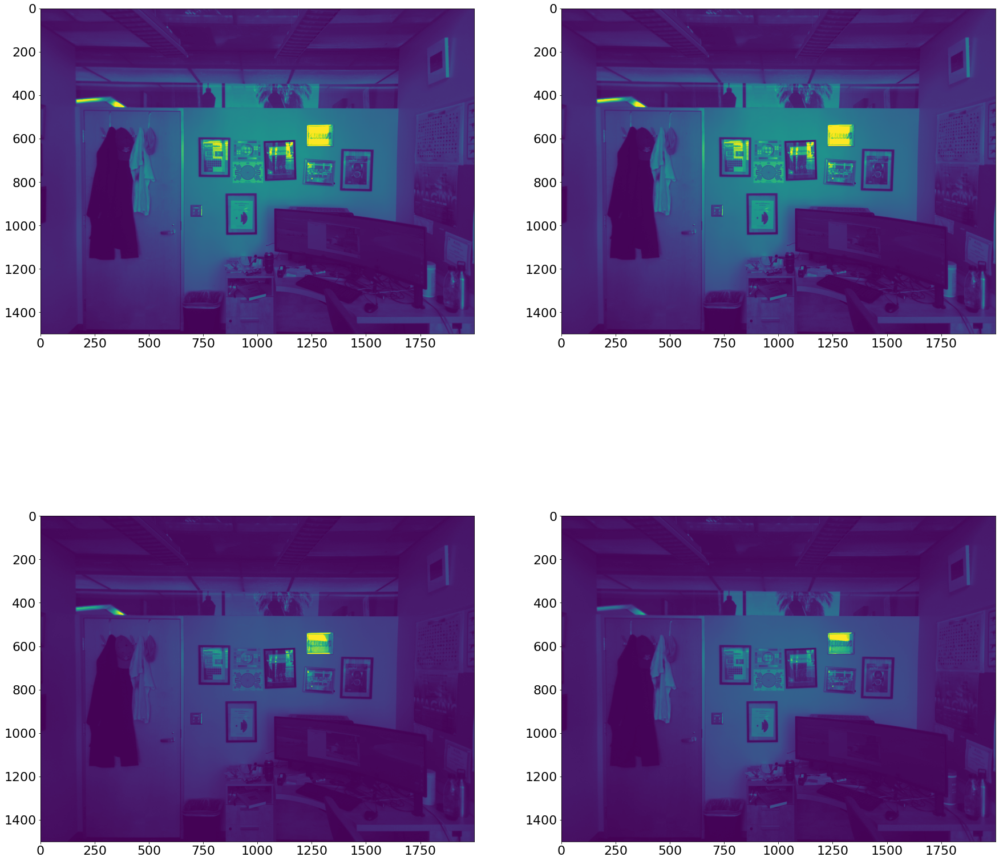

In [253]:
plt.figure(figsize=(30,30))
plt.subplot(2,2,1)
plt.imshow(g1)
plt.subplot(2,2,2)
plt.imshow(g2)
plt.subplot(2,2,3)
plt.imshow(r)
plt.subplot(2,2,4)
plt.imshow(b)

In [ ]:
g1.dtype

dtype('uint16')

In [254]:
print(np.max(b), np.min(b))

1023 1


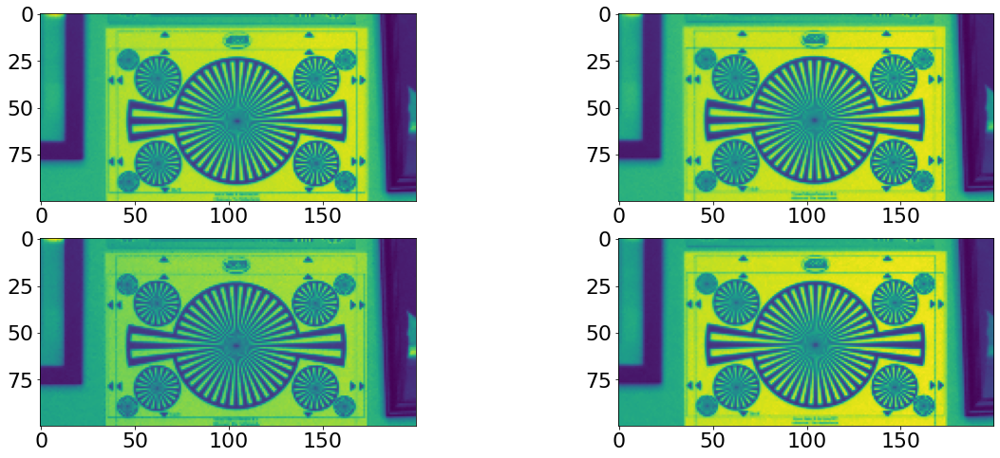

In [256]:
plt.subplot(2,2,1)
plt.imshow(g1[700:800,850:1050])
plt.subplot(2,2,2)
plt.imshow(g2[700:800,850:1050])
plt.subplot(2,2,3)
plt.imshow(r[700:800,850:1050])
plt.subplot(2,2,4)
plt.imshow(b[700:800,850:1050])

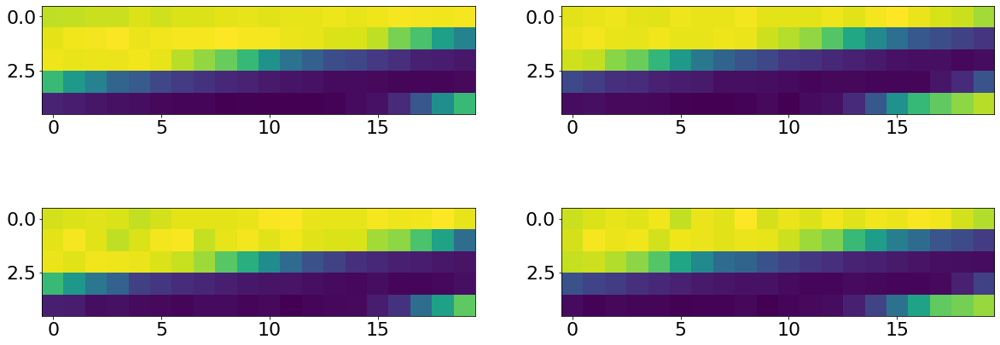

In [268]:
plt.rcParams['figure.figsize'] = [20, 8]
g1c=g1[760:765,900:920]
g2c=g2[760:765,900:920]
rc=r[760:765,900:920]
bc=b[760:765,900:920]
plt.subplot(2,2,1)
plt.imshow(g1c)
plt.subplot(2,2,2)
plt.imshow(g2c)
plt.subplot(2,2,3)
plt.imshow(rc)
plt.subplot(2,2,4)
plt.imshow(bc)

To find the relative displacement of the edge between rows we need to find the slope of the edge, which we do here.

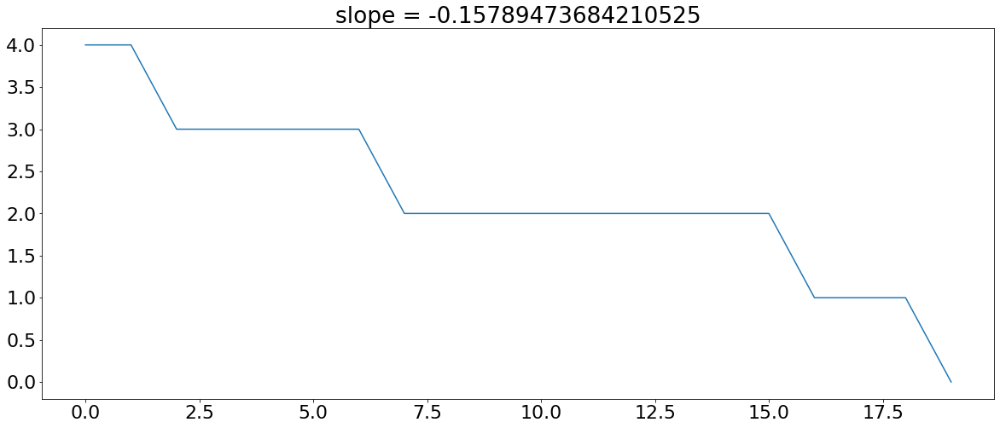

In [270]:
y=np.argmin(np.gradient(g1[760:765,900:920], axis=0),axis=0)
reg=stats.linregress(np.arange(len(y)),y)
plt.plot(y)
plt.title('slope = '+str(reg.slope))
slope=reg.slope


shifting the edge points according to the slope of the edge and combining data from multiple columns, we can densely sample the edge region. The function describing the edge is the edge shape function.

In [279]:
points=np.zeros((np.size(g1c),2))
for pop in np.arange(g1c.shape[0]):
  for pip in np.arange(g1c.shape[1]):
    points[pop*g1c.shape[1]+pip,:]=(pop-slope*pip,g1c[pop,pip])
points=points[points[:,0].argsort(),:]


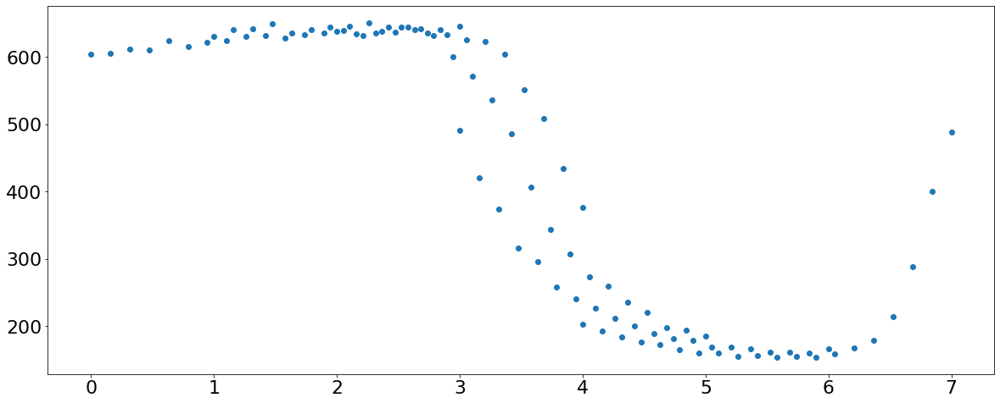

In [276]:
plt.scatter(points[:,0],points[:,1])

apparently we do not have enough accuracy on this short edge to estimate the slope accurately, thus the separation in the dot curves.

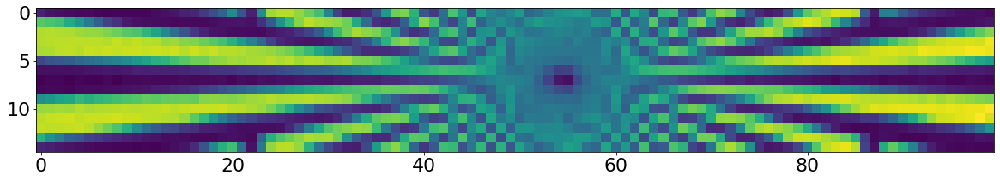

In [288]:
plt.imshow(g1[750:765,900:1000])

In [303]:
points=np.zeros((np.size(g1c),2))
for pop in np.arange(g1c.shape[0]):
  for pip in np.arange(g1c.shape[1]):
    points[pop*g1c.shape[1]+pip,:]=(pop-.75*slope*pip,g1c[pop,pip])
points=points[points[:,0].argsort(),:]


adjusting the estimated slope brings the multi row dot curves together. 


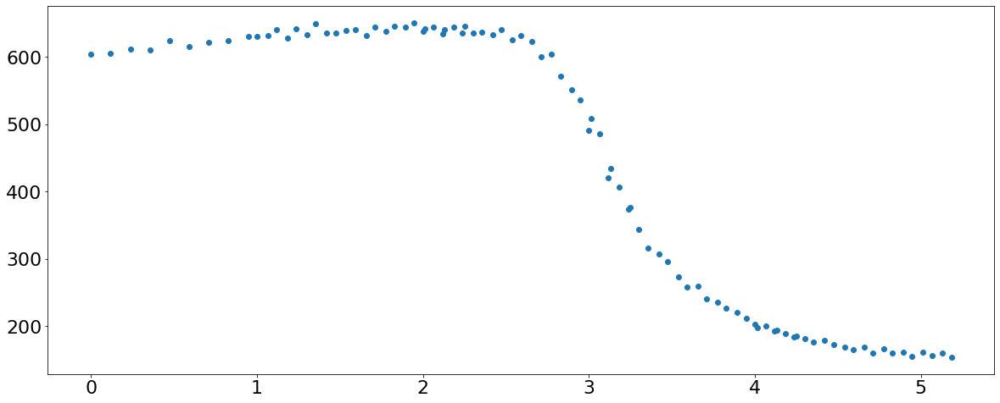

In [310]:
plt.scatter(points[:90,0],points[:90,1])

In [306]:
points.shape

(100, 2)

We choose to model the edge as an erf function and find the best fit parameters to the erf. 

In [311]:
def erfunc(x, A, c, sig, off):
    return A*erf((x-c)/sig)+off

A , c, sig, off = -100., 6., 2., 150.


params, extras = curve_fit(erfunc, points[:90,0],points[:90,1],
                                    p0=[A, c, sig, off])

Text(0.5, 0, 'pixels')

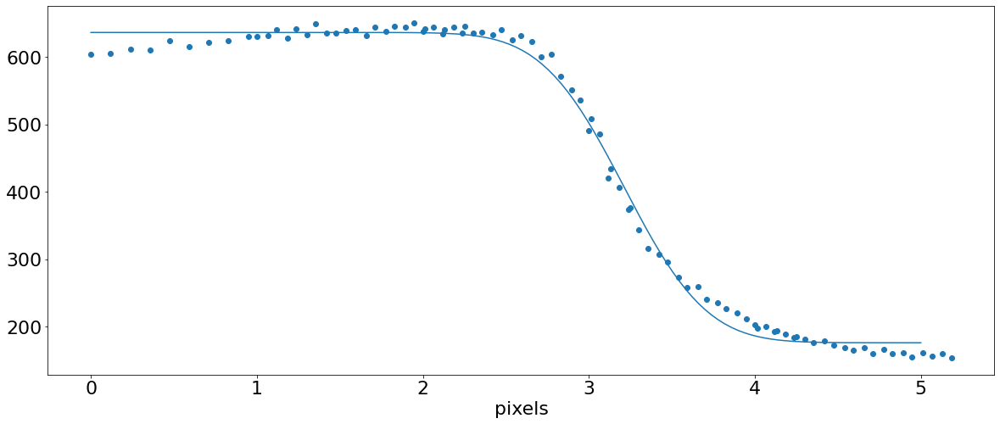

In [313]:
xx=np.linspace(-0,5,128)
plt.plot(xx, erfunc(xx, *params))
plt.scatter(points[:90,0],points[:90,1])
plt.xlabel('pixels')

The ERF function has the form
$$
{\rm erf}(x)=\frac{2}{\sqrt{\pi}}\int_0^x e^{-y^2}dy
$$
such that 
$$
\frac{d}{dx}{\rm erf}(x)=\frac{2}{\sqrt{\pi}}e^{-x^2}
$$

In our parameter fit of the edge, we are not concerned with the position or height, we are only concerned with the width, $\sigma$, which defines the width of the transition. Here our **line shape function**, e.g. the derivative of the edge shape function, accounting for the fact that the pixel spacing for each color channel is 2 microns, looks like this

Text(0.5, 0, 'microns')

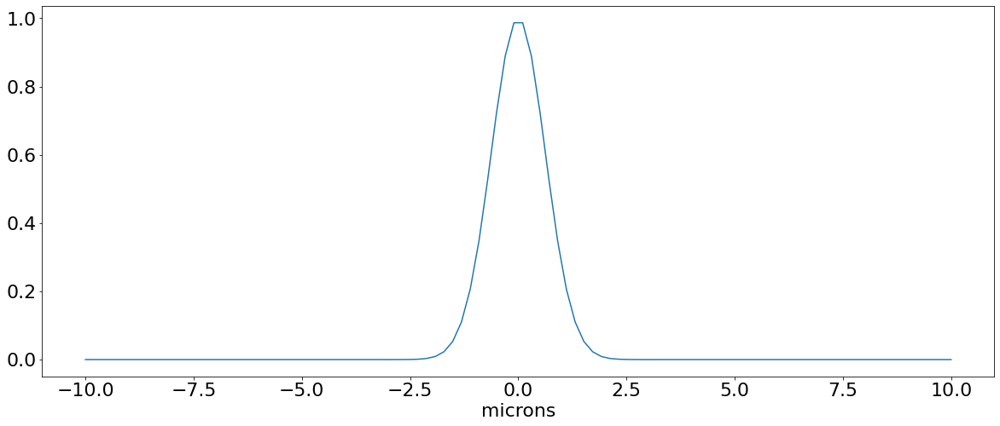

In [315]:
x=np.linspace(-10,10,100)
plt.plot(x, np.exp(-(x/(1.6*params[2]))**2))
plt.xlabel('microns')

In [316]:
params

array([-229.99717025,    3.21402023,    0.55259734,  406.43824553])

In [317]:
var=params[2]

In [318]:
var

0.552597343447657

Text(0, 0.5, 'mtf')

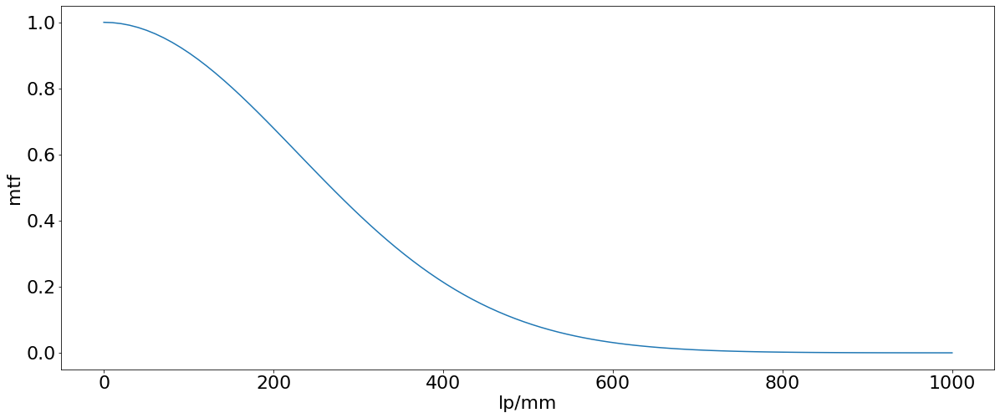

In [320]:
plt.plot(1000*np.linspace(0,1,100), np.exp(-(np.pi**2)*(3.2*var**2)*np.linspace(0,1,100)**2))
plt.xlabel("lp/mm")
plt.ylabel('mtf')

the wide field lens has better MTF than the telephoto, which is not surpising since the telephoto periscope likely leads to aberrations. 